In [118]:
%load_ext autoreload
%autoreload 2

import optuna
import pandas as pd
import lightgbm as lgb
import matplotlib.pyplot as plt
import shap
import numpy as np
import scipy
import seaborn as sns
import lightgbm as lgb
import numpy as np
import sklearn.datasets
import sklearn.metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, roc_auc_score
import pickle
import matplotlib as mpl

from utils.model import Metrics, save_model, load_model

SEED = 42

mpl.rcParams["figure.dpi"] = 200

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Prepare Data


In [119]:
from utils.pipeline import Pipeline, PipelineStep

from utils.helpers import reduce_mem_usage
from transform.set_missings import set_missings, drop_fraud
from transform.load_data import load_train_data, load_test_data
from transform.feature_selection import feature_selection
from transform.dpi_features import generate_test_dpi_feature, generate_train_dpi_feature
from transform.bnum_features import generate_test_bnum_feature, generate_train_bnum_feature
from transform.fe_features import generate_test_fe_feature, generate_train_fe_feature


def remove_abon_id(df):
    return df.drop("abon_id", axis=1)


transform_train_pipeline = Pipeline(
    "TRANSFORM_TRAIN",
    [
        # Load data
        PipelineStep(load_train_data),
        PipelineStep(set_missings),
        # New features
        PipelineStep(generate_train_fe_feature),
        PipelineStep(generate_train_dpi_feature),
        PipelineStep(generate_train_bnum_feature),
        PipelineStep(drop_fraud),
        # Feature selection
        PipelineStep(remove_abon_id),
    ],
)

transform_test_pipeline = Pipeline(
    "TRANSFORM_TEST",
    [
        # Load data
        PipelineStep(load_test_data),
        PipelineStep(set_missings),
        # New features
        PipelineStep(generate_test_fe_feature),
        PipelineStep(generate_test_dpi_feature),
        PipelineStep(generate_test_bnum_feature),
        # Feature selection
        PipelineStep(remove_abon_id),
    ],
)

In [60]:
train_data = transform_train_pipeline.run()

print("Shape:", train_data.shape)

2024-08-05 12:22:28 - Running pipeline: TRANSFORM_TRAIN (0:11:29)
2024-08-05 12:22:28 - 0. Running step: load_train_data (0:11:29)
2024-08-05 12:22:28 - 1. Running step: set_missings (0:11:29)
2024-08-05 12:22:31 - 2. Running step: generate_train_fe_feature (0:11:31)
2024-08-05 12:22:32 - 3. Running step: generate_train_dpi_feature (0:11:33)
2024-08-05 12:22:34 - 4. Running step: generate_train_bnum_feature (0:11:34)
2024-08-05 12:22:35 - 5. Running step: drop_fraud (0:11:35)
2024-08-05 12:22:35 - 6. Running step: remove_abon_id (0:11:36)
2024-08-05 12:22:36 - 8. Done (0:11:36)


-----------------

Shape: (149998, 1443)


In [61]:
test_data = transform_test_pipeline.run()

print("Shape:", test_data.shape)

2024-08-05 12:22:38 - Running pipeline: TRANSFORM_TEST (0:11:39)
2024-08-05 12:22:38 - 0. Running step: load_test_data (0:11:39)
2024-08-05 12:22:38 - 1. Running step: set_missings (0:11:39)
2024-08-05 12:22:41 - 2. Running step: generate_test_fe_feature (0:11:41)
2024-08-05 12:22:42 - 3. Running step: generate_test_dpi_feature (0:11:42)
2024-08-05 12:22:43 - 4. Running step: generate_test_bnum_feature (0:11:44)
2024-08-05 12:22:45 - 5. Running step: remove_abon_id (0:11:45)
2024-08-05 12:22:45 - 7. Done (0:11:46)


-----------------

Shape: (150000, 1444)


## Studies

You can find more details in `research/studies`. This folder contains all study strategies I tried
In this section I'll focus on best results I received


In [11]:
import json
import optuna
from utils.helpers import create_or_load_optuna_study
from utils.model import save_model
from imblearn.over_sampling import SMOTE
import sklearn
import random
from sklearn.model_selection import train_test_split
import warnings
from imblearn.under_sampling import RandomUnderSampler

warnings.filterwarnings("ignore")

np.random.seed(SEED)
random.seed(SEED)

VERSION = "new_features_v1"

print("Train data shape:", train_data.shape)

sub_train_x, sub_val_x, sub_train_y, sub_val_y = train_test_split(
    train_data.drop(columns="target"),
    train_data.target,
    test_size=0.2,
    random_state=SEED,
    stratify=train_data.target,
)

sub_train_data = sub_train_x.copy()
sub_train_data["target"] = sub_train_y

resampled_x, resampled_y = oversampling(sub_train_data, not_churned_size=0.7, churned_size=0.7)

dtrain = lgb.Dataset(resampled_x, label=resampled_y)
dvalid = lgb.Dataset(sub_val_x, label=sub_val_y)

static_params = {
    "random_state": SEED,
    "seed": SEED,
    "objective": "binary",
    "metric": "auc",
    "verbosity": -1,
    "boosting_type": "gbdt",
    "feature_pre_filter": False,
    "early_stopping_rounds": 120,
    "n_jobs": -1,
}


def objective(trial):
    params = {
        **static_params,
        "lambda_l1": trial.suggest_int("lambda_l1", 4, 12),
        "lambda_l2": trial.suggest_int("lambda_l2", 4, 12),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.06, log=True),
        "num_leaves": trial.suggest_int("num_leaves", 10, 40, step=2),
        "feature_fraction": trial.suggest_float("feature_fraction", 0.2, 1.0),
        "bagging_fraction": trial.suggest_float("bagging_fraction", 0.2, 1.0),
        "max_depth": trial.suggest_int("max_depth", 9, 15),
        "min_child_samples": trial.suggest_int("min_child_samples", 10, 150, step=10),
        "n_estimators": trial.suggest_int("n_estimators", 100, 350, step=25),
        "drop_rate": trial.suggest_categorical("drop_rate", [0.1, 0.2, 0.3, 0.4]),
    }

    print("Params:", params)

    f1_scores = []
    auc_scores = []

    model = lgb.train(
        params,
        dtrain,
        valid_sets=[dvalid],
    )

    def evaluate_model(X, y_true, model, threshold=0.5):
        y_pred_proba = model.predict(X, num_iteration=model.best_iteration)
        y_pred = (y_pred_proba >= threshold).astype(int)
        roc_auc = sklearn.metrics.roc_auc_score(y_true, y_pred_proba)
        f1 = sklearn.metrics.f1_score(y_true, y_pred, pos_label=1)

        auc_scores.append(roc_auc)
        f1_scores.append(f1)

        return roc_auc, f1

    train_X = sub_train_x[resampled_x.columns]
    train_y_true = sub_train_y

    train_roc_auc_score, train_f1_score = evaluate_model(train_X, train_y_true, model)
    print("ROC AUC:", train_roc_auc_score, "F1 Score:", train_f1_score)

    val_X = sub_val_x[resampled_x.columns]
    val_y_true = sub_val_y

    val_roc_auc_score, val_f1_score = evaluate_model(val_X, val_y_true, model)
    print("VAL ROC AUC:", val_roc_auc_score, "VAL F1 Score:", val_f1_score)

    low_auc_penalty = 10 if val_roc_auc_score < 0.9 else 0

    return (
        0.7 * np.mean(auc_scores)
        + 0.3 * np.mean(f1_scores)
        - (10 * np.std(auc_scores))
        - (10 * np.std(f1_scores))
        - low_auc_penalty
    )


study_name = f"LightGbmV5_{VERSION}"

study = optuna.create_study(
    study_name=study_name,
    storage="sqlite:///example.db",
    direction="maximize",
    load_if_exists=True,
)

try:
    study.optimize(objective, n_trials=1000)

finally:
    trial = study.best_trial

    model_params = {**static_params, **trial.params}

    print("Best params:", model_params)

    # save best params
    with open(f"parameters/{study_name}.json", "wb") as f:
        f.write(json.dumps(model_params).encode())

    print("Done!")

### Best results


In [5]:
def show_metrics(model_cls, dataframe, features, threshold=0.5):
    X = dataframe[features]
    y_true = dataframe.target

    y_pred_proba = model_cls.booster_.predict(X)
    y_pred = (y_pred_proba >= threshold).astype(int)

    Metrics().call(y_true, y_pred, y_pred_proba)

## Train model


In [120]:
train_df = feature_selection(train_data)

print("Train data shape:", train_df.shape)

model_params = {
    "random_state": 42,
    "seed": 42,
    "objective": "binary",
    "metric": "auc",
    "verbosity": -1,
    "boosting_type": "gbdt",
    "feature_pre_filter": False,
    "n_jobs": -1,
    "lambda_l1": 8,
    "lambda_l2": 5,
    "learning_rate": 0.018,
    "num_leaves": 14,
    "feature_fraction": 0.6803603979260223,
    "bagging_fraction": 0.6735621254996546,
    "max_depth": 11,
    "min_child_samples": 30,
    "n_estimators": 350,
    "drop_rate": 0.2,
    "is_unbalance": True,
}

model_cls = lgb.LGBMClassifier(**model_params)

train_x = train_df.drop(columns="target")
train_y = train_df.target

model_cls = model_cls.fit(train_x, train_y)

features = list(train_x.columns)
optimal_threshold = 0.5

Train data shape: (149998, 57)


In [121]:
import sklearn.metrics

print("Train metrics")
show_metrics(model_cls, train_data, features, optimal_threshold)

Train metrics

Metrics
AUC: 0.912
F Beta score: 0.303
Matthews Correlation Coefficient: 0.407
Classification Report:
              precision    recall  f1-score   support

         0.0       0.99      0.84      0.91    140413
         1.0       0.26      0.83      0.40      9585

    accuracy                           0.84    149998
   macro avg       0.62      0.84      0.65    149998
weighted avg       0.94      0.84      0.87    149998



In [122]:
print("Test metrics")
show_metrics(model_cls, test_data, features, optimal_threshold)

Test metrics

Metrics
AUC: 0.898
F Beta score: 0.291
Matthews Correlation Coefficient: 0.390
Classification Report:
              precision    recall  f1-score   support

         0.0       0.98      0.84      0.91    140597
         1.0       0.25      0.81      0.38      9403

    accuracy                           0.84    150000
   macro avg       0.62      0.82      0.64    150000
weighted avg       0.94      0.84      0.87    150000



### Save results


In [22]:
save_model(model_cls, "BEST_lgbm_p025_r081_0898auc", list(features))
model_cls, features = load_model("BEST_lgbm_p025_r081_0898auc.pickle")

Save BEST_lgbm_p025_r081_0898auc


## Learning Curve


In [25]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve


def build_learning_curve_plt(train_sizes, train_scores, val_scores):
    # Calculate mean and standard deviation for training and validation scores
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    val_scores_mean = np.mean(val_scores, axis=1)
    val_scores_std = np.std(val_scores, axis=1)

    # Витягнення даних з найвищими середніми оцінками
    best_train_index = np.argmax(train_scores_mean)
    best_test_index = np.argmax(train_scores_mean)

    best_train_size = train_sizes[best_train_index]
    best_train_score_mean = train_scores_mean[best_train_index]
    best_train_score_std = train_scores_std[best_train_index]

    # Plot learning curve
    plt.figure()
    plt.title("Learning Curve")
    plt.xlabel("Training examples")
    plt.ylabel("ROC-AUC Score")
    plt.grid()

    plt.fill_between(
        train_sizes,
        train_scores_mean - train_scores_std,
        train_scores_mean + train_scores_std,
        alpha=0.1,
        color="r",
    )
    plt.fill_between(
        train_sizes, val_scores_mean - val_scores_std, val_scores_mean + val_scores_std, alpha=0.1, color="g"
    )
    plt.plot(train_sizes, train_scores_mean, "o-", color="r", label="Training score")
    plt.plot(train_sizes, val_scores_mean, "o-", color="g", label="Cross-validation score")

    plt.legend(loc="best")
    plt.show()

In [86]:
X = train_data[features]
y_true = train_data.target

# Get learning curve data
train_sizes, train_scores, val_scores = learning_curve(
    lgb.LGBMClassifier(**model_params),
    X,
    y_true,
    cv=10,
    n_jobs=-1,
    train_sizes=np.linspace(0.1, 1.0, 5),
    scoring="roc_auc",
)

In [23]:
build_learning_curve_plt(train_sizes, train_scores, val_scores)

## Analyze results


In [123]:
from sklearn.metrics import accuracy_score, f1_score
import matplotlib.pyplot as plt


def find_threshold(y_test, y_pred_proba):
    # Define a range of possible thresholds
    thresholds = np.linspace(0, 1, 100)
    accuracies = []

    # Calculate accuracy for each threshold
    for threshold in thresholds:
        y_pred = (y_pred_proba >= threshold).astype(int)
        score = sklearn.metrics.fbeta_score(y_test, y_pred, beta=1)
        accuracies.append(score)

    # Find the threshold that provides the highest accuracy
    max_accuracy_index = np.argmax(accuracies)
    optimal_threshold = thresholds[max_accuracy_index]

    print(f"Optimal Threshold for Maximum Score: {optimal_threshold}")
    print(f"Maximum Score: {accuracies[max_accuracy_index]}")

    return optimal_threshold


X = train_data[features]
y_true = train_data.target

y_pred_proba_calibr = model_cls.booster_.predict(X)

optimal_threshold = find_threshold(y_true, y_pred_proba_calibr)

Optimal Threshold for Maximum Score: 0.8080808080808082
Maximum Score: 0.5211988997439059


In [124]:
# Train
train_y_true = train_data.target
train_y_pred_proba = model_cls.booster_.predict(train_data[features])
train_y_pred = (train_y_pred_proba >= optimal_threshold).astype(int)

# Test
test_y_true = test_data.target
test_y_pred_proba = model_cls.booster_.predict(test_data[features])
test_y_pred = (test_y_pred_proba >= optimal_threshold).astype(int)

### ROC Curve


In [125]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc


def plot_roc_curve(y_train, y_test):
    fpr1, tpr1, _ = roc_curve(*y_train)
    roc_auc1 = auc(fpr1, tpr1)

    # fpr2, tpr2, _ = roc_curve(*y_val)
    # roc_auc2 = auc(fpr2, tpr2)

    fpr3, tpr3, _ = roc_curve(*y_test)
    roc_auc3 = auc(fpr3, tpr3)

    plt.figure()
    plt.plot(
        fpr1, tpr1, color="blue", lw=2, label=f"Train dataset: {roc_auc1:.3f} ({roc_auc1:.2f})", linestyle="--"
    )
    # plt.plot(fpr2, tpr2, color="red", lw=2, label=f"Валідаційна вибірка: {roc_auc2:.3f} ({roc_auc2:.2f})")
    plt.plot(fpr3, tpr3, color="green", lw=2, label=f"Test dataset: {roc_auc3:.3f} ({roc_auc3:.2f})")
    plt.plot([0, 1], [0, 1], color="grey", lw=2, linestyle="--")

    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC AUC Curve")
    plt.legend(loc="lower right")
    plt.show()

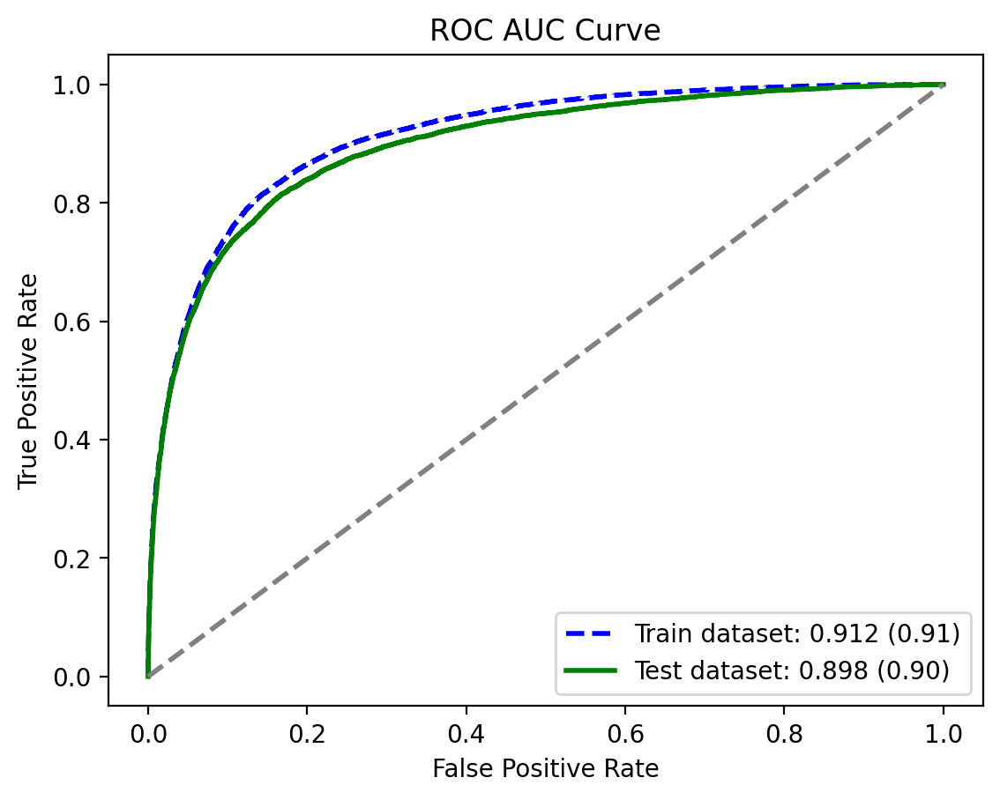

In [126]:
plot_roc_curve((train_y_true, train_y_pred_proba), (test_y_true, test_y_pred_proba))

In [127]:
# Test data

X = test_data[features]
y_pred_proba = test_y_pred_proba
y_pred = test_y_pred
y_true = test_y_true

### Confusion Matrix


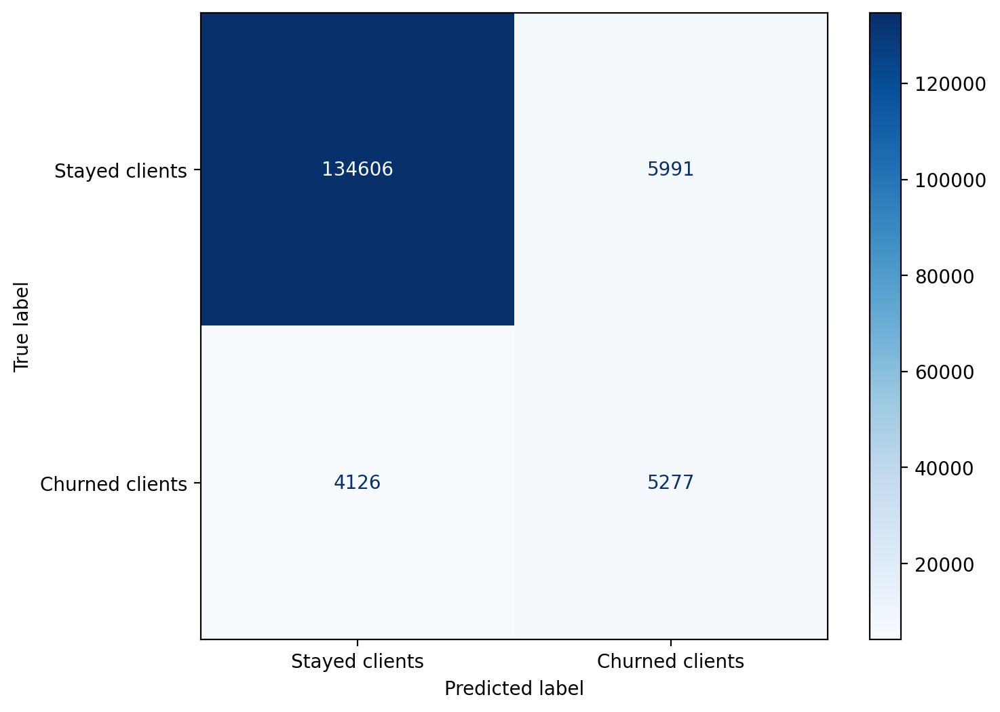

In [128]:
classes = ["Stayed clients", "Churned clients"]

cm = confusion_matrix(y_true, y_pred)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
fig, ax = plt.subplots(figsize=(8, 6))
disp.plot(cmap="Blues", ax=ax)
plt.show()

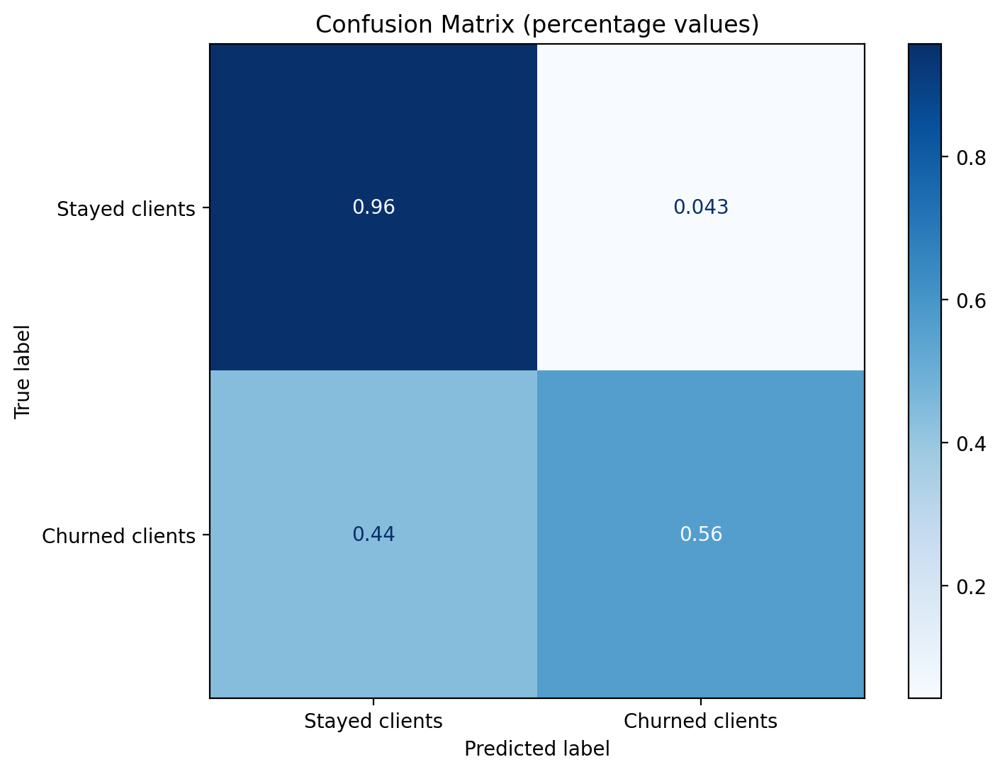

In [129]:
cm = confusion_matrix(y_true, y_pred, normalize="true")

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
fig, ax = plt.subplots(figsize=(8, 6))
disp.plot(cmap="Blues", ax=ax)
plt.title("Confusion Matrix (percentage values)")
plt.show()

### Scoring distribution


In [130]:
import plotly.express as px

pred_df = pd.DataFrame(
    {
        "y_pred_proba": y_pred_proba[y_true == 0],
        "Churn": y_true[y_true == 0],
    }
)

fig = px.histogram(
    pred_df,
    x="y_pred_proba",
    color="Churn",
    marginal="box",
    nbins=100,
    title="Distribution of probabilities for the class 'Stayed clients'",
    color_discrete_map={0: "blue", 1: "red"},
)

fig.update_layout(
    bargap=0.1,
    xaxis_title="Probability that client will leave",
    yaxis_title="Count",
    legend_title="Class",
)

fig.update_layout(width=1000, height=400)

fig.show()

In [131]:
import plotly.express as px

pred_df = pd.DataFrame(
    {
        "y_pred_proba": y_pred_proba[y_true == 1],
        "Churn": y_true[y_true == 1],
    }
)

fig = px.histogram(
    pred_df,
    x="y_pred_proba",
    color="Churn",
    marginal="box",
    nbins=100,
    title="Distribution of probabilities for the class 'Churned clients'",
    color_discrete_map={0: "blue", 1: "red"},
)

fig.update_layout(
    bargap=0.1, xaxis_title="Probability that client will leave", yaxis_title="Count", legend_title="Class",
)

fig.update_layout(width=1000, height=400)

fig.show()

### Conversion


In [132]:
df_pred_train = pd.DataFrame(columns=["pred", "pred_proba", "target"])

df_pred_train["pred"] = y_pred.copy()
df_pred_train["pred_proba"] = y_pred_proba.copy()
df_pred_train["target"] = y_true.astype(int).copy()
data_base = df_pred_train[["pred_proba", "target"]]

# Prediction
data_base = data_base.sort_values(by="pred_proba")
data_base.index = np.arange(1, len(data_base) + 1)
data_base["prediction"] = data_base.index / len(data_base)

# Build
base_rate = (1 - data_base["prediction"]) * 100
base_rate = base_rate.apply(np.floor) + 1

# розбиваємо базу по 5% - якщо потрібно по-іншому - замінюємо 5 на інше число
base_rate = (base_rate / 5).apply(np.ceil)
base_rate = base_rate * 5

data_base["rate"] = base_rate

# формуємо фінальну таблицю, зберігаємо
data_stat = data_base[["pred_proba", "target", "rate"]].groupby(["target", "rate"]).count()
data_stat.reset_index(inplace=True)

data_stat = data_stat.pivot(index="rate", columns="target", values="pred_proba")
data_stat = data_stat.fillna(0)

data_stat_df = data_stat.cumsum().reset_index()

data_stat_df.rename(columns={0: "not_churn", 1: "churn"}, inplace=True)

data_stat_df["conversion"] = (
    data_stat_df["churn"] * 100 / (data_stat_df["churn"] + data_stat_df["not_churn"])
).round(2)

# Get last row
total_churn = data_stat_df["churn"].iloc[-1]
total_not_churn = data_stat_df["not_churn"].iloc[-1]

overall_conversion = (total_churn * 100) / (total_churn + total_not_churn)

# Розрахунок Lift для кожного сегмента
data_stat_df["lift"] = data_stat_df["conversion"] / overall_conversion

data_stat_df["churn_coverage"] = (data_stat_df["churn"] * 100) / total_churn
data_stat_df["not_churn_coverage"] = (data_stat_df["not_churn"] * 100) / total_not_churn

data_stat_df

target,rate,not_churn,churn,conversion,lift,churn_coverage,not_churn_coverage
0,5.0,3271,4229,56.39,8.995533,44.975008,2.326508
1,10.0,8982,6019,40.12,6.400085,64.011486,6.388472
2,15.0,15522,6978,31.01,4.946825,74.210358,11.040065
3,20.0,22429,7572,25.24,4.026375,80.527491,15.952687
4,25.0,29545,7955,21.21,3.383495,84.600659,21.013962
5,30.0,36733,8267,18.37,2.930448,87.918749,26.126447
6,35.0,44024,8476,16.14,2.574710,90.141444,31.312190
7,40.0,51358,8642,14.40,2.297139,91.906838,36.528518
8,45.0,58715,8786,13.02,2.076997,93.438264,41.761204
9,50.0,66100,8900,11.87,1.893545,94.650643,47.013805


In [113]:
data_stat_df.to_excel("output.xlsx", index=False)

### Gain and Lift Charts


<Axes: title={'center': 'Lift Curve'}, xlabel='Percentage of sample', ylabel='Lift'>

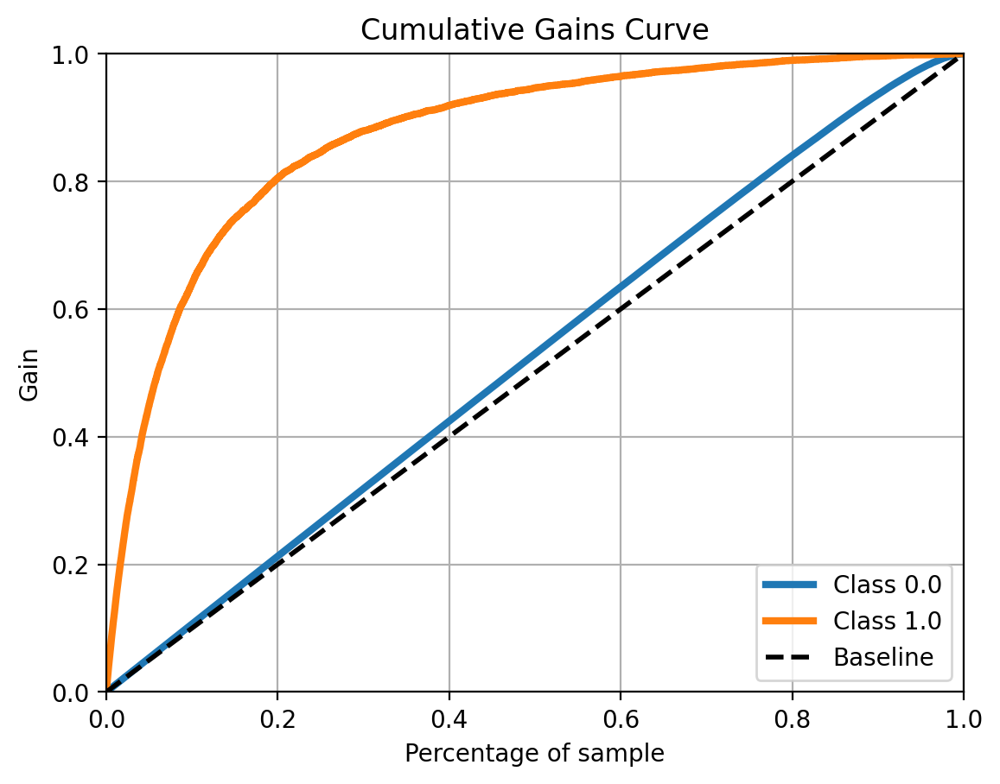

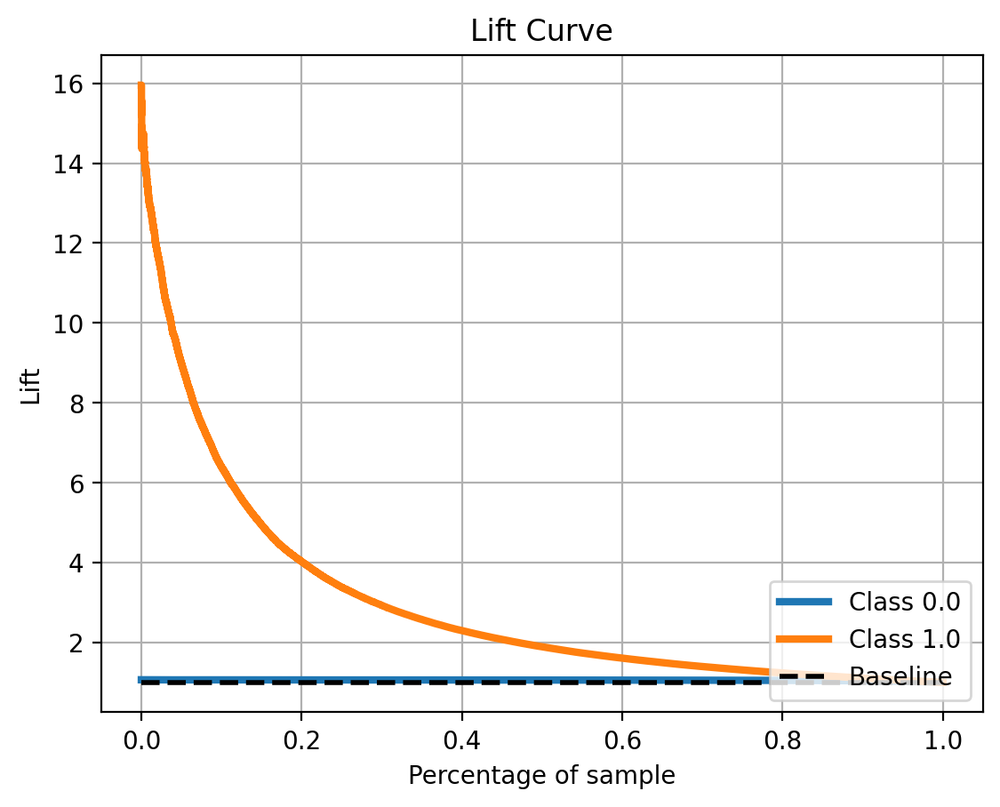

In [133]:
import pandas as pd
import numpy as np
import scikitplot as skplt

y_true = test_data.target
y_pred_prob = model_cls.predict_proba(test_data[features])

skplt.metrics.plot_cumulative_gain(y_true, y_pred_prob)
skplt.metrics.plot_lift_curve(y_true, y_pred_prob)

### Check Threshold Diff


In [134]:
def get_treshold(y_test, y_pred):
    fpr, tpr, thresholds = roc_curve(y_test, y_pred)
    gmeans = np.sqrt(tpr * (1 - fpr))
    ix = np.argmax(gmeans)
    return thresholds[ix]


y_train_true = train_data.target
y_train_pred_prob = model_cls.predict_proba(train_data[features])[:, 1]

y_test_true = test_data.target
y_test_pred_prob = model_cls.predict_proba(test_data[features])[:, 1]

train_threshold = get_treshold(y_train_true, y_train_pred_prob)
test_threshold = get_treshold(y_test_true, y_test_pred_prob)

print("Treshold (Train): ", train_threshold)
print("Treshold (Test): ", test_threshold)
print("Diff: ", train_threshold - test_threshold)

Treshold (Train):  0.5126505644292982
Treshold (Test):  0.48996825501982866
Diff:  0.02268230940946958


## Analyze features


In [135]:
importances = model_cls.booster_.feature_importance(importance_type="gain")
importance_df = pd.DataFrame(list(zip(features, importances)), columns=["Feature", "Importance"])

# Report
feature_importances = importance_df.sort_values(by="Importance", ascending=False)
feature_importances = feature_importances[feature_importances.Importance > 5000]

list(feature_importances.Feature)

['num_act_days_min_mnt3',
 'device_days_usage',
 'num_act_days_mea_mnt1',
 'loc_market_share',
 'voice_in_tar_dur_min_total',
 'num_act_days_std_total',
 'num_act_days_mea_mnt3',
 'voice_in_td_cnt_mea_mnt1',
 'days_of_last_ppm',
 'lt',
 'all_cnt_min_mnt3',
 'voice_in_tar_dur_min_mnt1',
 'day_end_gba',
 'days_of_end_last_ppm',
 'conn_out_uniq_cnt_min_total',
 'loc_is_obl_center',
 'all_cnt_std_total',
 'voice_in_td_cnt_min_total',
 'sms_in_cnt_std_mnt3',
 'casual_topic_cnt_sms_in_sum',
 'other_cnt_sms_in_sum',
 'Balance_uah',
 'sms_in_cnt_std_total',
 'imei_mean_days_usage',
 'voice_mts_in_dwork_part_mea_mnt3',
 'casual_act_cnt_sms_in',
 'all_cnt_std_mnt1',
 'voice_in_td_cnt_td_total',
 'MAX_of_day_cnt_susp_app_sum',
 'device_type_rus_other',
 'voice_in_kievstar_part_mea_total',
 'content_cnt_mea_mnt3',
 'all_cnt_std_mnt3',
 'avg_paym_6_month',
 'conn_out_uniq_cnt_mea_mnt1',
 'data_3g_tv_cnt_std_mnt3',
 'sum_paym_6_month',
 'voice_mts_out_dwork_partmea_mnt3',
 'voice_out_tar_dur_min_mnt

In [136]:
import plotly.express as px

fig = px.bar(feature_importances[:10], x="Importance", y="Feature", title="Feature Importance")
fig.update_layout(yaxis={"categoryorder": "total ascending"}, width=900, height=900)
fig.show()

In [137]:
explainer = shap.TreeExplainer(model_cls)
shap_values = explainer(test_data[features])

In [138]:
shap_importance = pd.DataFrame(
    list(zip(features, np.abs(shap_values.values).mean(axis=0))), columns=["feature", "importance"]
).sort_values(by="importance", ascending=False)

shap_features = shap_importance[:10]

list(shap_features.feature)

['num_act_days_min_mnt3',
 'device_days_usage',
 'num_act_days_std_total',
 'num_act_days_mea_mnt1',
 'days_of_last_ppm',
 'lt',
 'Balance_uah',
 'loc_market_share',
 'voice_in_td_cnt_td_total',
 'voice_in_kievstar_part_mea_total']

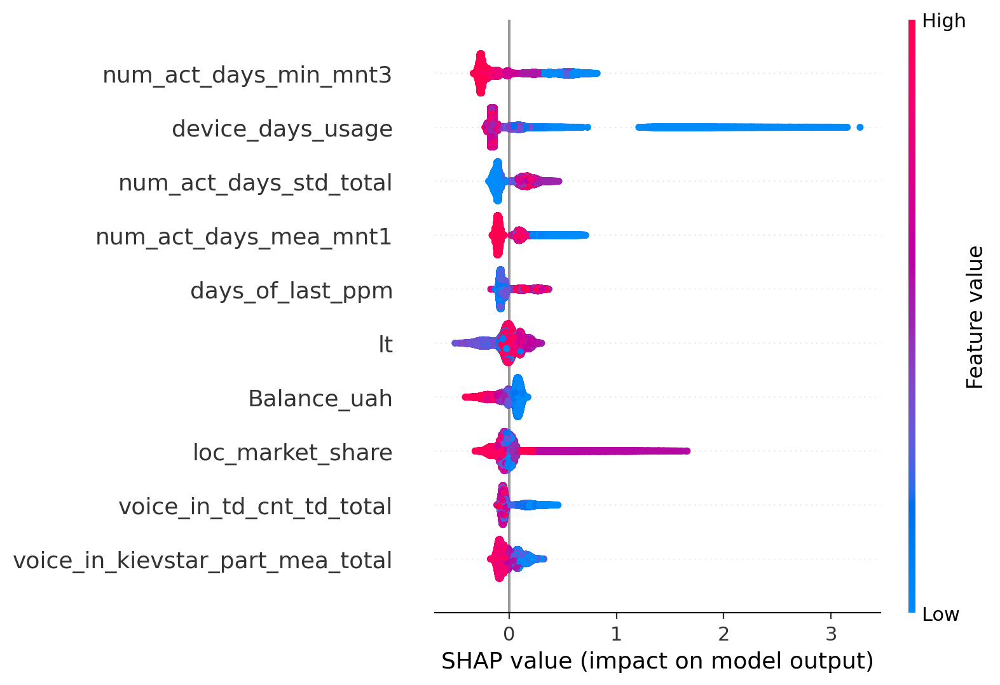

In [139]:
shap.summary_plot(shap_values, test_data[features], max_display=len(shap_features))

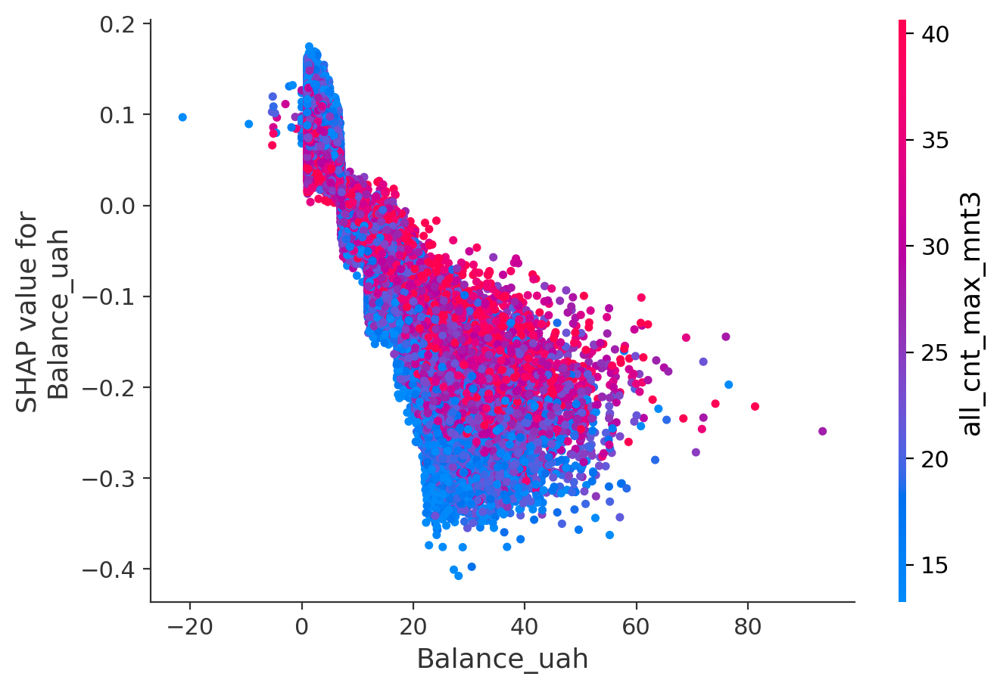

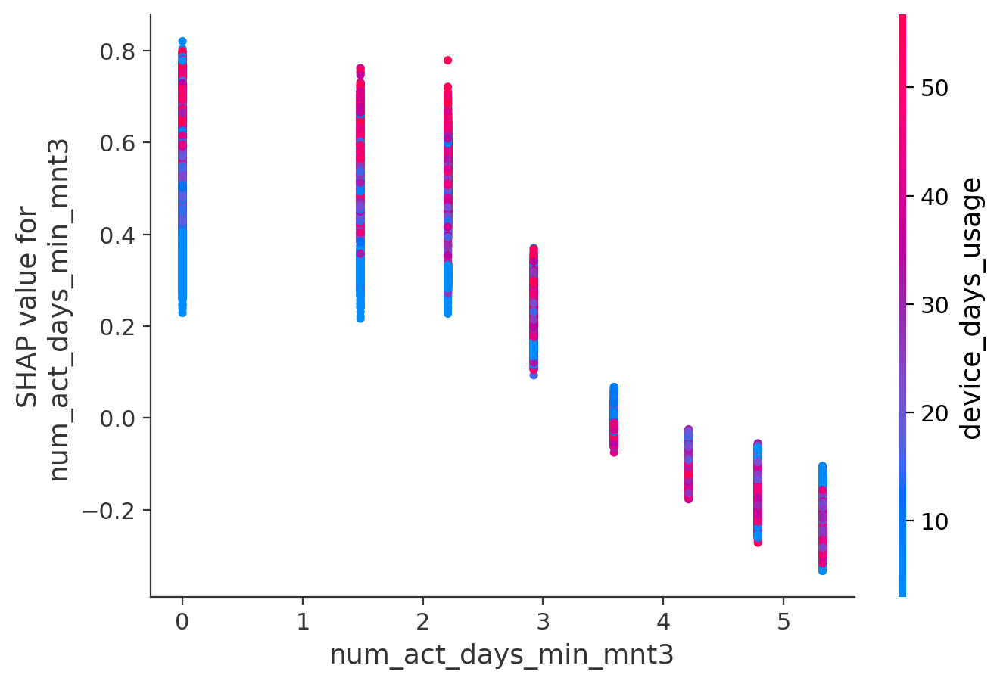

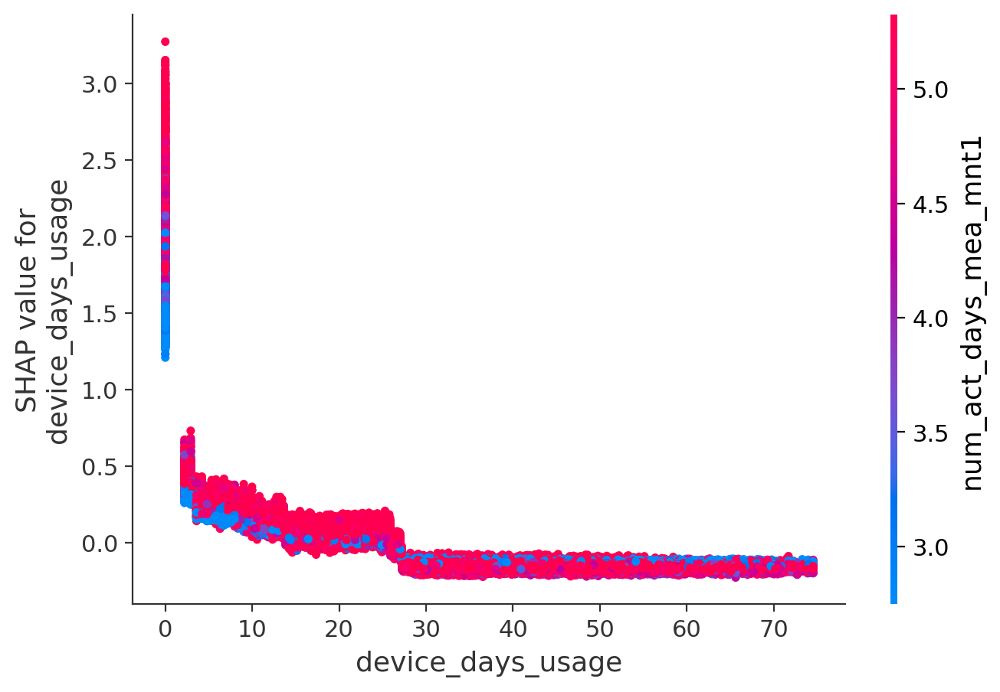

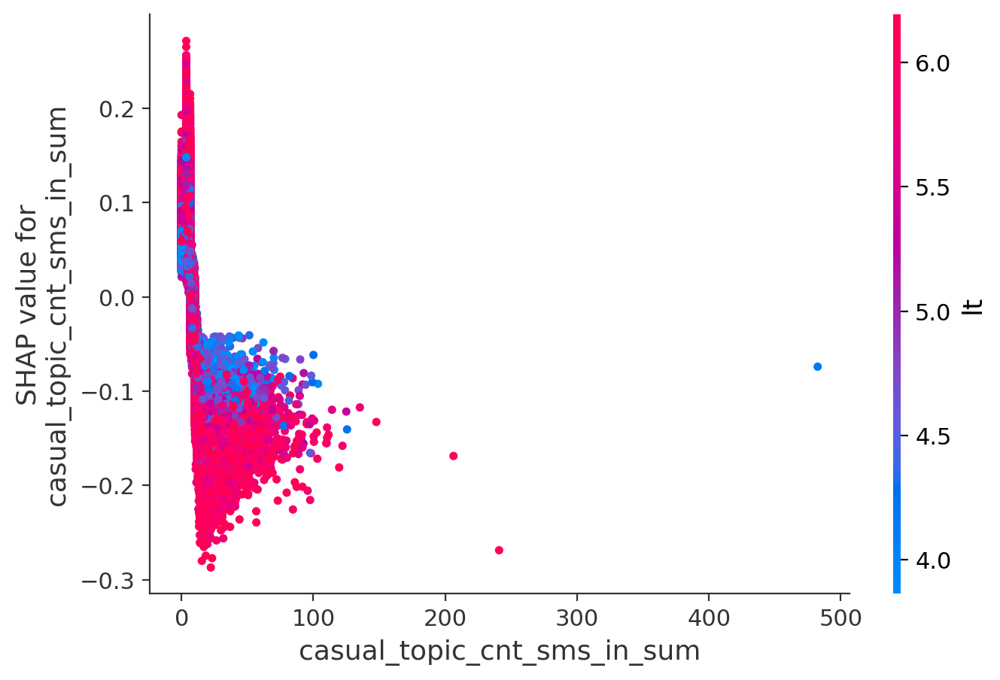

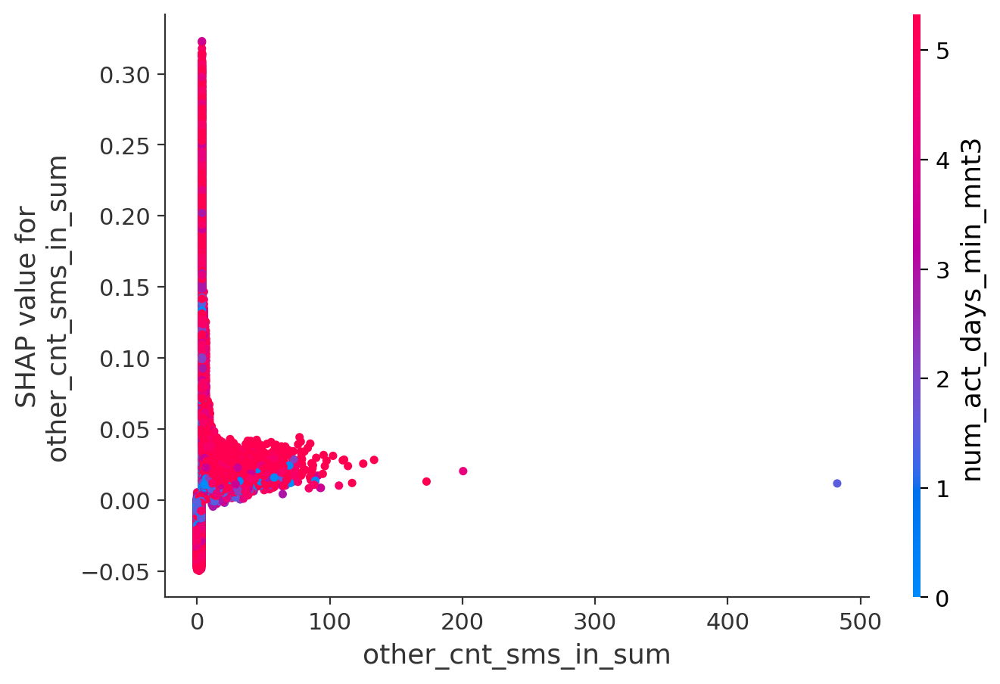

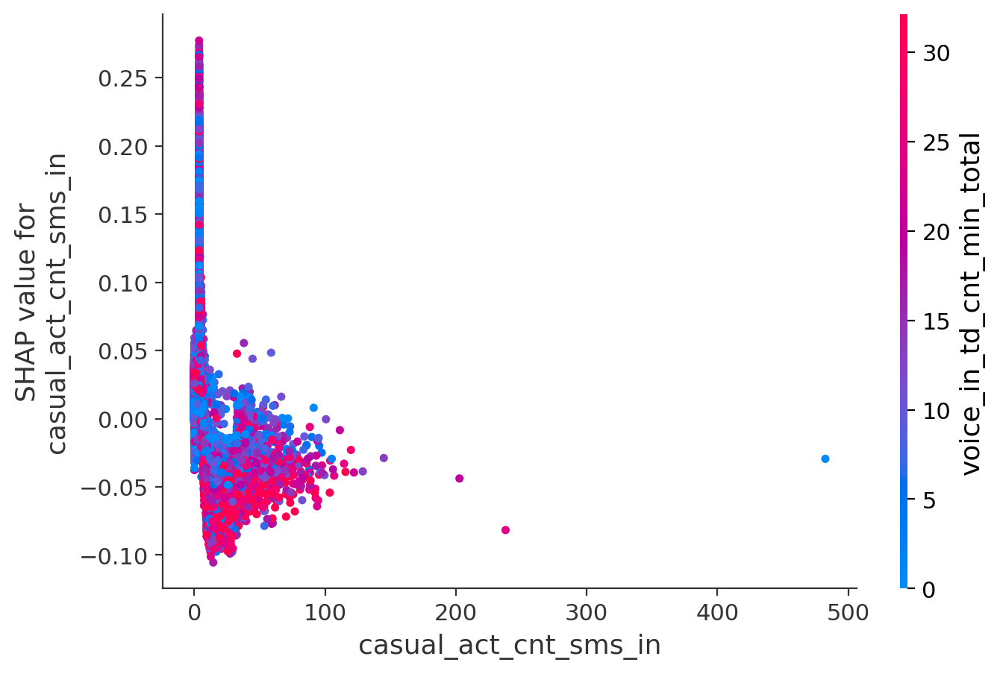

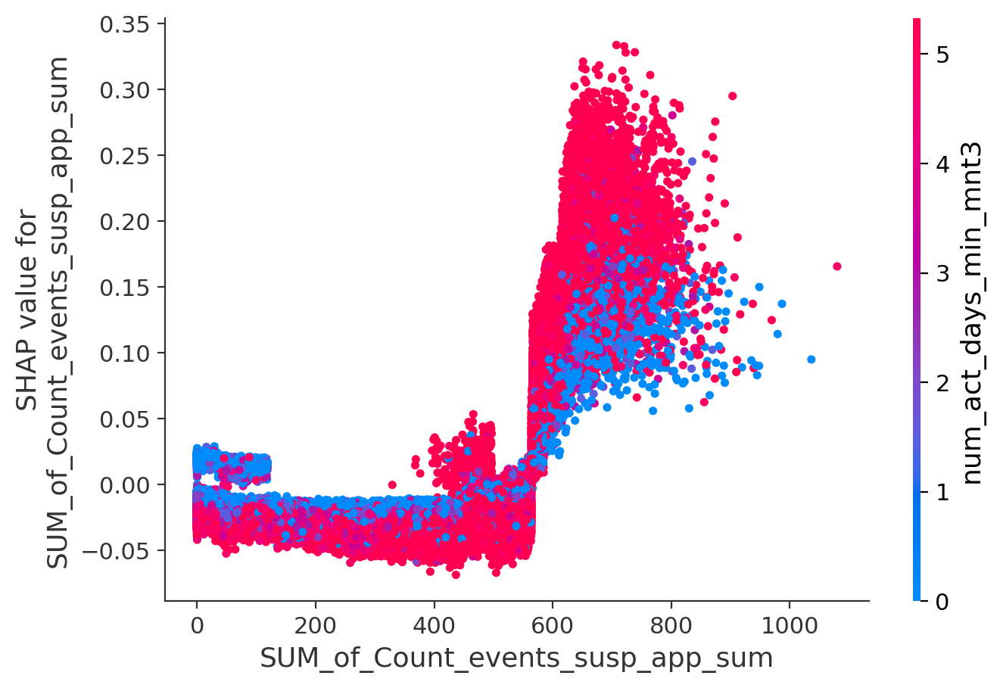

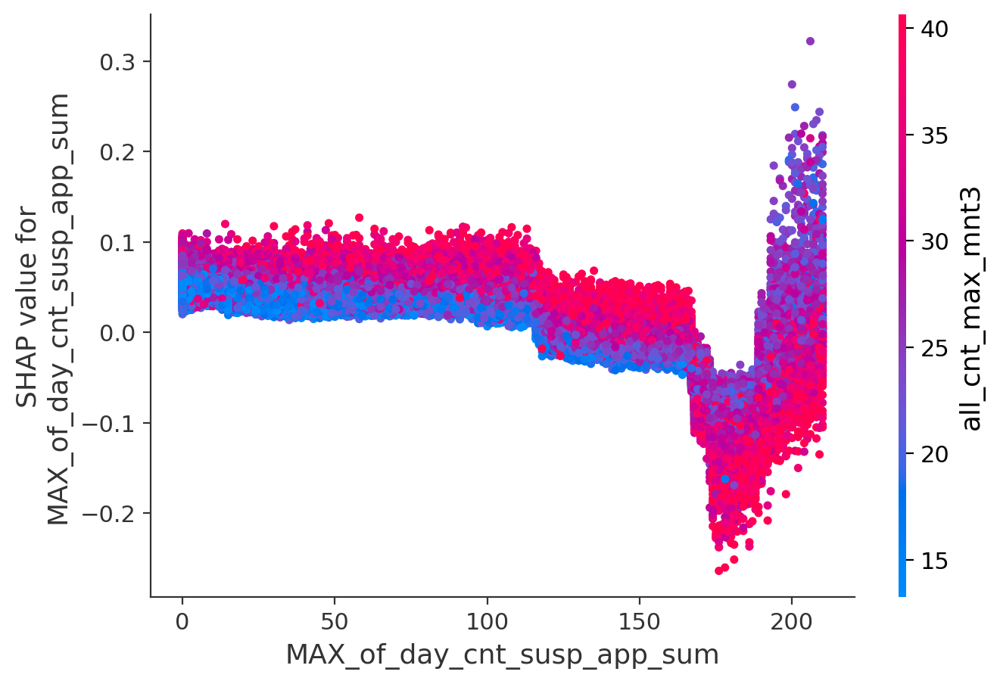

In [140]:
feature_importances_nams = feature_importances["Feature"].values


def render_shap_plot(feature_name):
    shap.dependence_plot(feature_name, shap_values.values, test_data[features])


render_shap_plot("Balance_uah")
render_shap_plot("num_act_days_min_mnt3")
render_shap_plot("device_days_usage")
render_shap_plot("casual_topic_cnt_sms_in_sum")
render_shap_plot("other_cnt_sms_in_sum")
render_shap_plot("casual_act_cnt_sms_in")
render_shap_plot("SUM_of_Count_events_susp_app_sum")
render_shap_plot("MAX_of_day_cnt_susp_app_sum")

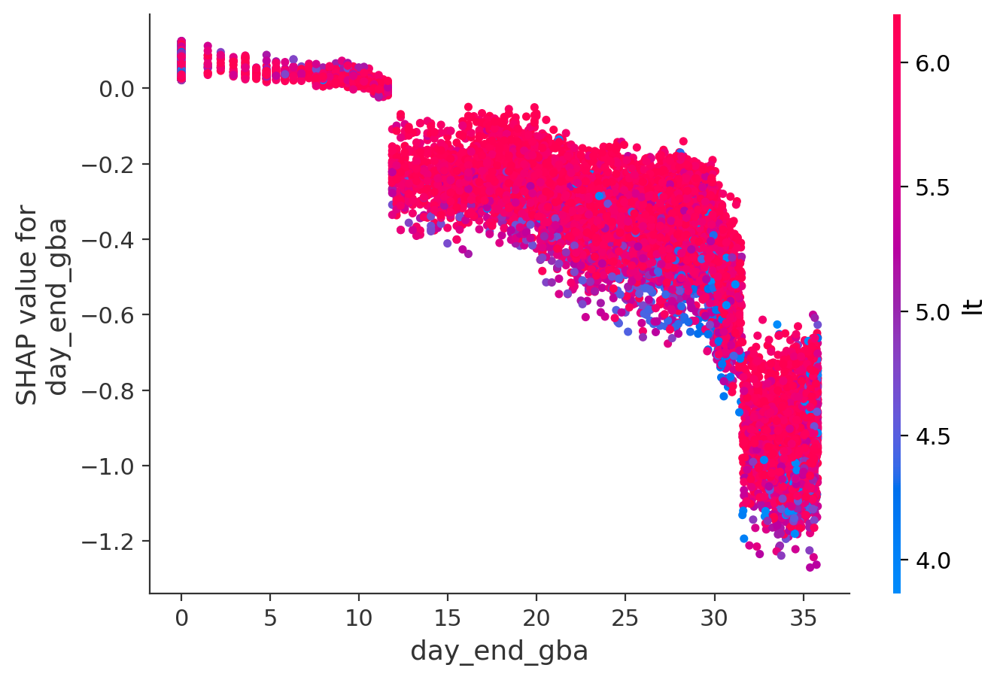

In [141]:
shap.dependence_plot("day_end_gba", shap_values.values, test_data[features], interaction_index="lt")

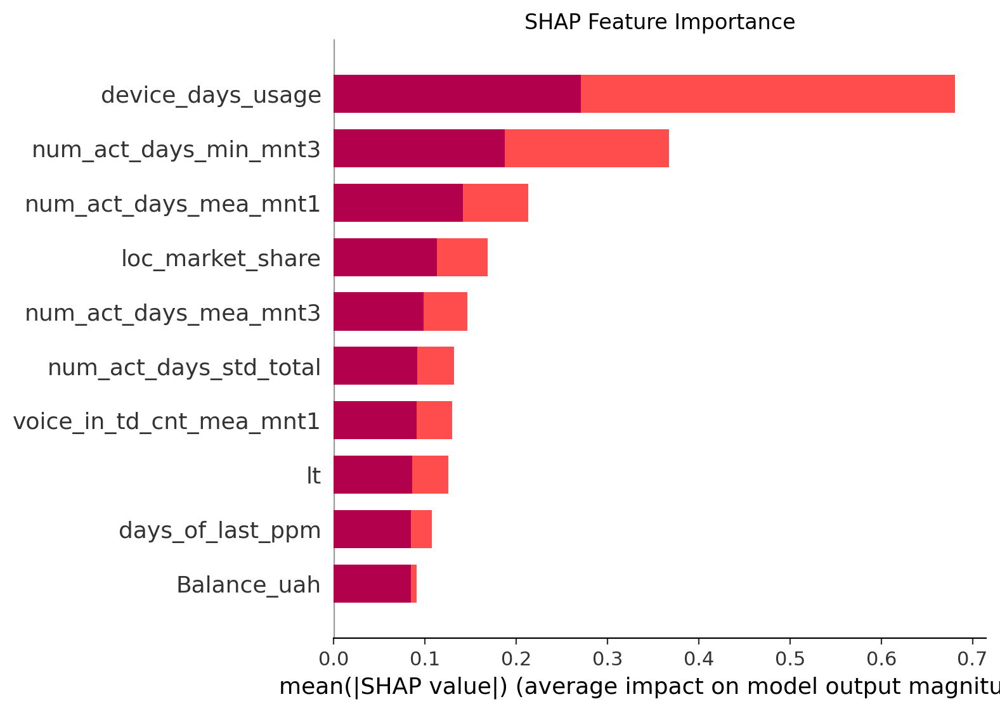

In [142]:
X_test = test_data[features]
y_test = test_data.target

# Розділення SHAP значень за класами
shap_values_0 = shap_values.values[y_test == 0]
shap_values_1 = shap_values.values[y_test == 1]

plt.figure()
shap.summary_plot(shap_values_0, X_test[y_test == 0], plot_type="bar", show=False, color="blue", max_display=10)

# Overlay the plot for the second class (red with opacity)
shap.summary_plot(shap_values_1, X_test[y_test == 1], plot_type="bar", show=False, color="red", max_display=10)

# Adjust the transparency of the red bars
for patch in plt.gca().patches:
    if patch.get_facecolor() == (1.0, 0.0, 0.0, 1.0):
        patch.set_facecolor((1.0, 0.0, 0.0, 0.7))

plt.title("SHAP Feature Importance")
plt.show()

In [143]:
# Train
train_data_df = train_data.copy()
train_y_true = train_data_df.target
train_y_pred_proba = model_cls.booster_.predict(train_data_df[features])
train_y_pred = (train_y_pred_proba >= optimal_threshold).astype(int)
train_data_df["pred"] = train_y_pred

# Test
test_data_df = test_data.copy()
test_y_true = test_data_df.target
test_y_pred_proba = model_cls.booster_.predict(test_data[features])
test_y_pred = (test_y_pred_proba >= optimal_threshold).astype(int)
test_data_df["pred"] = test_y_pred

In [144]:
from sklearn.cluster import KMeans

X = train_data_df[features]

kmeans = KMeans(n_clusters=3, random_state=42)

kmeans.fit(X)

KMeans(n_clusters=3, random_state=42)

In [145]:
X_test = test_data_df[X.columns]

In [146]:
labels = kmeans.labels_

train_data_df["cluster"] = kmeans.predict(X)
test_data_df["cluster"] = kmeans.predict(X_test)

In [147]:
import itertools

dataframe = test_data_df.copy()

features_to_analyse = dataframe.columns[:-2]
clusters = dataframe.cluster.unique()

df = train_data_df.groupby("cluster").mean().T

std_statistic_df = {}

for index in range(len(features_to_analyse)):
    std_statistic_df[features_to_analyse[index]] = df.iloc[index].values.std()

std_statistic_df = pd.DataFrame(std_statistic_df, index=[0])

std_statistic_df.T.sort_values(by=0, ascending=False)[:50]

,0
non_accum_internet_vol_mea_diff,247.521370
voice_out_cmpttrs_avg_dumin_total,212.782492
data_3g_tar_vol_mea_diff,176.821039
non_accum_internet_vol_max_diff,176.065287
non_accum_internet_vol_std_diff,149.027226
data_3g_tar_vol_max_diff,143.673817
non_accum_internet_vol_min_diff,124.629377
data_3g_tar_vol_std_diff,123.380549
non_accum_internet_vol_max_mnt1,92.079063
non_accum_internet_vol_mea_mnt1,86.804791


In [148]:
def combo_plot(df, combo, hue="cluster"):
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=df, x=combo[0], y=combo[1], hue=hue, palette="viridis")
    plt.title(f"Scatter Plot: {combo[0]} vs {combo[1]}")
    plt.xlabel(combo[0])
    plt.ylabel(combo[1])
    plt.legend(title="Cluster")
    plt.show()

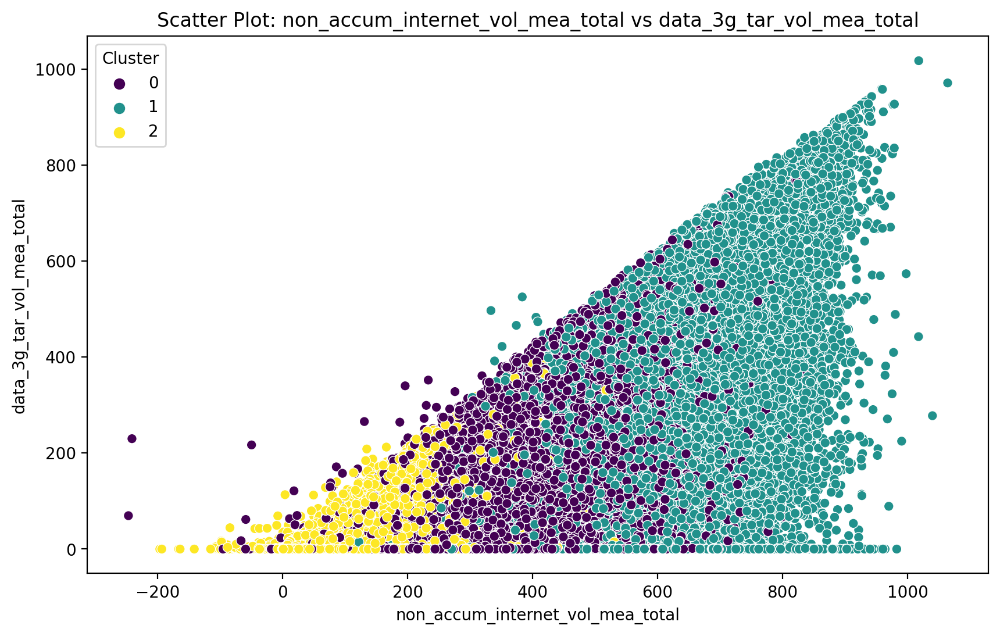

In [149]:
combo_plot(
    dataframe,
    [
        "non_accum_internet_vol_mea_total",
        "data_3g_tar_vol_mea_total",
    ],
)

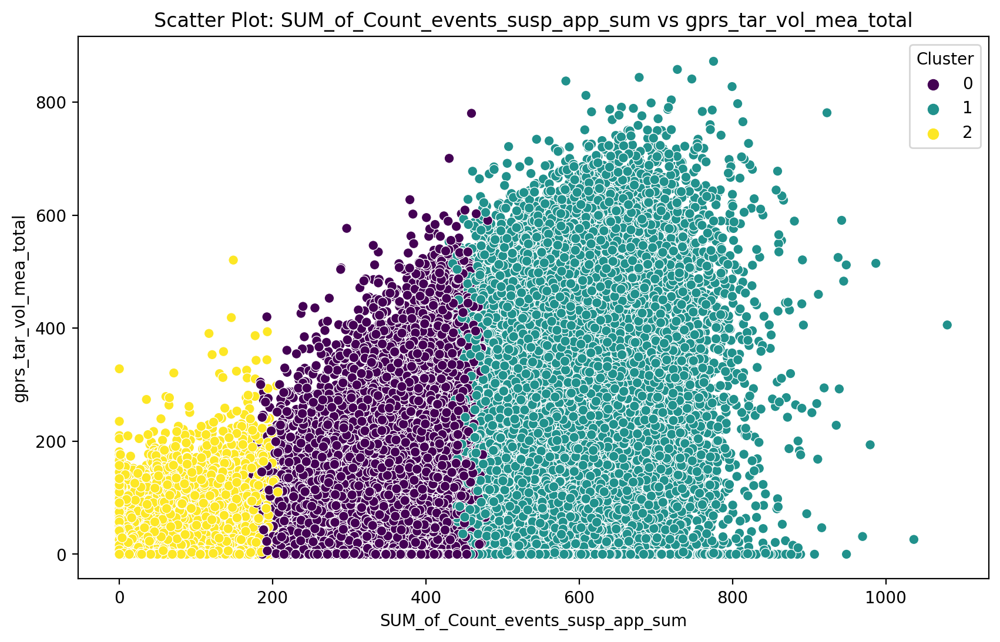

In [150]:
combo_plot(
    dataframe,
    [
        "SUM_of_Count_events_susp_app_sum",
        "gprs_tar_vol_mea_total",  # Тарифицируемый объем передачи данных - стат.метрика
    ],
)

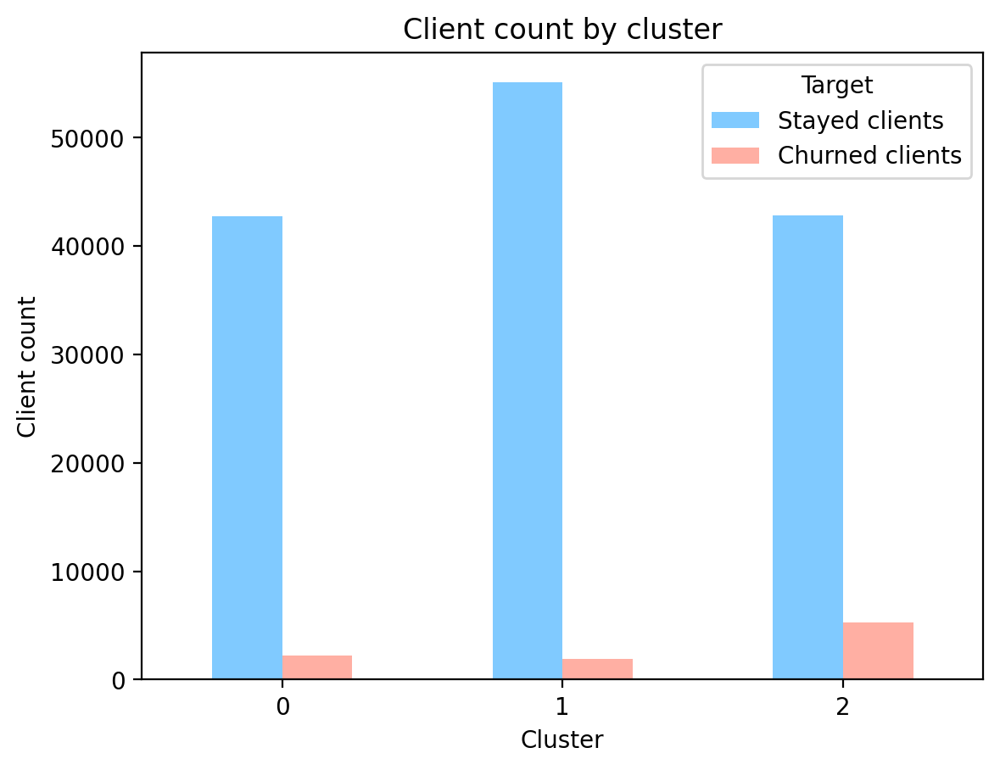

In [151]:
NOT_CHURNED_CLIENT_TITLE = "Stayed clients"
CHURNED_CLIENT_TITLE = "Churned clients"

NOT_CHURNED_COLOR = "#80CAFF"
CHURNED_COLOR = "#FFAFA3"

SNS_TARGET_LABELS = [CHURNED_CLIENT_TITLE, NOT_CHURNED_CLIENT_TITLE]

dataframe["target"] = dataframe.target.astype(int)

df = dataframe.groupby("cluster")["target"].value_counts()

df = df.reset_index()

pivot_df = df.pivot(index="cluster", columns="target", values="count")

# Unstack the pivoted DataFrame to get clusters side by side
unstacked_df = pivot_df.unstack().reset_index()
unstacked_df.columns = ["target", "cluster", "count"]

# Pivot again to get the required format
final_df = unstacked_df.pivot(index="cluster", columns="target", values="count")

# Plotting
final_df.plot(kind="bar", color=[NOT_CHURNED_COLOR, CHURNED_COLOR])
plt.xlabel("Cluster")
plt.ylabel("Client count")
plt.title("Client count by cluster")
plt.legend(title="Target", labels=[NOT_CHURNED_CLIENT_TITLE, CHURNED_CLIENT_TITLE])
plt.xticks(rotation=0)
plt.show()

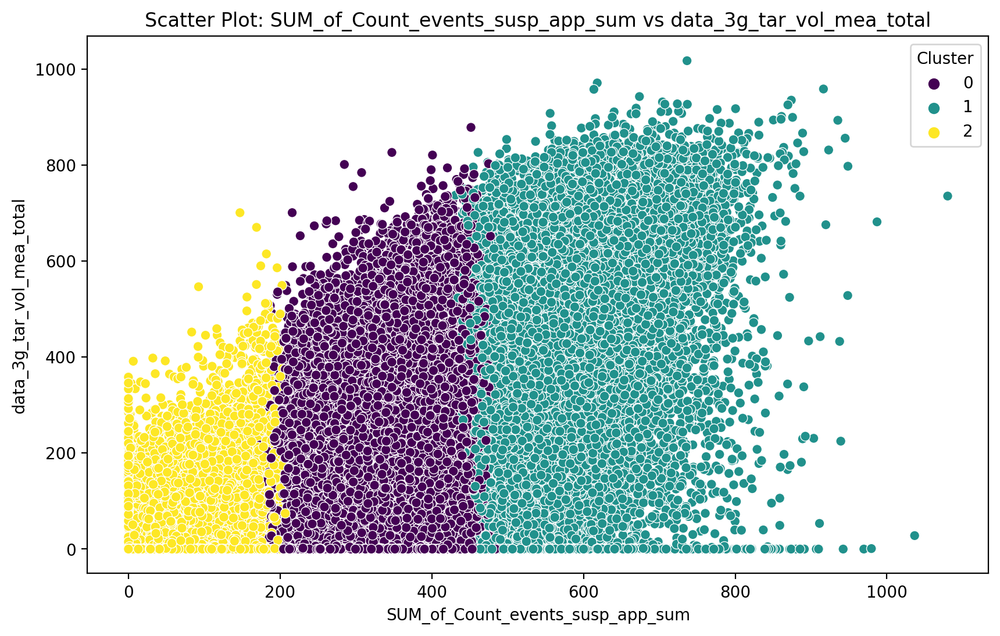

In [152]:
combo_plot(
    dataframe,
    [
        "SUM_of_Count_events_susp_app_sum",
        "data_3g_tar_vol_mea_total",
    ],
)

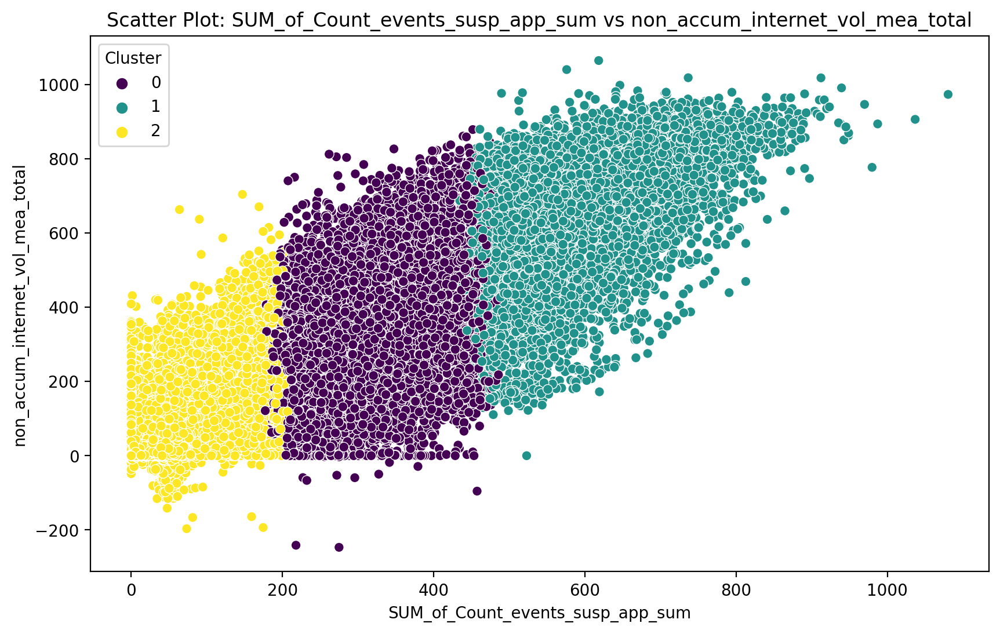

In [153]:
combo_plot(
    dataframe,
    [
        "SUM_of_Count_events_susp_app_sum",
        "non_accum_internet_vol_mea_total",  # Объем переданных данных вне пакета услуг - стат.метрика
    ],
)